# Лабораторная работа 2

Численное решение уравнения переноса

In [1]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
%matplotlib inline
import pandas as pd
import numpy as np

def plot_animation(scheme, problem):
    plt.rcParams["animation.html"] = "jshtml"
    plt.rcParams['figure.dpi'] = 150  
    plt.ioff()

    x = []
    for i in range(8):
        xdata = pd.read_csv('out/animations/{}/{}/x_{}.csv'.format(scheme, problem, i))
        ydata = pd.read_csv('out/animations/{}/{}/y_{}.csv'.format(scheme, problem, i))
        yexactdata = pd.read_csv('out/animations/{}/{}/y_exact_{}.csv'.format(scheme, problem, i))
        x = np.concatenate((x, (xdata.to_numpy()).flatten()))
        if (i == 0):
            y_t = ydata.to_numpy()
            y_exact_t = yexactdata.to_numpy()
        else:
            y_t = np.concatenate((y_t, ydata.to_numpy()), axis = 1)
            y_exact_t = np.concatenate((y_exact_t, yexactdata.to_numpy()), axis = 1)

    fig, ax = plt.subplots()

    def animate(frame):
        plt.cla()
        plt.plot(x, y_exact_t[frame])
        plt.plot(x, y_t[frame])

    return animation.FuncAnimation(fig, animate, frames=180, interval=20)

def plot_bad_animation(scheme, problem):
    plt.rcParams["animation.html"] = "jshtml"
    plt.rcParams['figure.dpi'] = 150  
    plt.ioff()

    x = []
    for i in range(5):
        xdata = pd.read_csv('out/animations/{}/{}/x_{}.csv'.format(scheme, problem, i))
        ydata = pd.read_csv('out/animations/{}/{}/y_{}.csv'.format(scheme, problem, i))
        yexactdata = pd.read_csv('out/animations/{}/{}/y_exact_{}.csv'.format(scheme, problem, i))
        x = np.concatenate((x, (xdata.to_numpy()).flatten()))
        if (i == 0):
            y_t = ydata.to_numpy()
            y_exact_t = yexactdata.to_numpy()
        else:
            y_t = np.concatenate((y_t, ydata.to_numpy()), axis = 1)
            y_exact_t = np.concatenate((y_exact_t, yexactdata.to_numpy()), axis = 1)

    fig, ax = plt.subplots()

    def animate(frame):
        plt.cla()
        plt.plot(x, y_exact_t[frame])
        plt.plot(x, y_t[frame])

    return animation.FuncAnimation(fig, animate, frames=5, interval=200)

In [2]:
def plot_errors(scheme, stable):
    fig, ax = plt.subplots(1, 3, figsize = (12, 4))
    plt.subplots_adjust(wspace=0.5)

    for i in range(8):
        datahtau = pd.read_csv('out/errors/{}/error_h_tau_{}.csv'.format(scheme, i))
        if (i == 0):
            h = datahtau['h']
            tau = datahtau['tau']
            error = datahtau['error']
        else:
            error = np.maximum(error, datahtau['error'])
    ax[0].set_xlabel("h = tau")
    ax[0].set_ylabel("error")
    ax[0].loglog(h, error)

    h = h[h < 10e-2]
    error = error[error.size - h.size:]
    m, b = np.polyfit(np.log(h), np.log(error), 1)
    ax[0].text(0.05, 0.95, 'order of convergence = {:.2f}'.format(m), horizontalalignment='left', verticalalignment='top', transform=ax[0].transAxes)

    for i in range(8):
        datah = pd.read_csv('out/errors/{}/error_h_{}.csv'.format(scheme, i))
        if (i == 0):
            h = datah['h']
            tau = datah['tau']
            error = datah['error']
        else:
            error = np.maximum(error, datah['error'])
    ax[1].set_xlabel("h")
    ax[1].set_ylabel("error")
    ax[1].loglog(h, error)

    h = h[h < 1e-2]
    error = error[error.size - h.size:]
    m, b = np.polyfit(np.log(h), np.log(error), 1)
    ax[1].text(0.05, 0.95, 'order of convergence = {:.2f}'.format(m), horizontalalignment='left', verticalalignment='top', transform=ax[1].transAxes)

    if (stable):
        for i in range(8):
            datatau = pd.read_csv('out/errors/{}/error_tau_{}.csv'.format(scheme, i))
            if (i == 0):
                h = datatau['h']
                tau = datatau['tau']
                error = datatau['error']
            else:
                error = np.maximum(error, datatau['error'])
        ax[2].set_xlabel("tau")
        ax[2].set_ylabel("error")
        ax[2].loglog(tau, error)

        tau = h[h < 10e-2]
        error = error[error.size - h.size:]
        m, b = np.polyfit(np.log(tau), np.log(error), 1)
        ax[2].text(0.05, 0.95, 'order of convergence = {:.2f}'.format(m), horizontalalignment='left', verticalalignment='top', transform=ax[2].transAxes)

    plt.show()

## Левый уголок

In [ ]:
plot_animation("left_angle", "rectangle")

In [ ]:
plot_animation("left_angle", "hat")

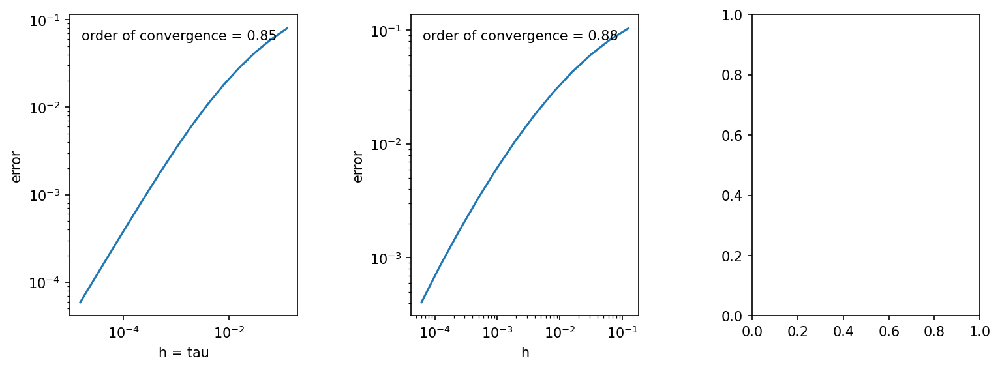

In [99]:
plot_errors("left_angle", False)

## Правый уголок

In [ ]:
plot_animation("right_angle", "rectangle")

In [ ]:
plot_animation("right_angle", "hat")

## Неявный уголок

In [ ]:
plot_animation("implicit_angle", "rectangle")

In [ ]:
plot_animation("implicit_angle", "hat")

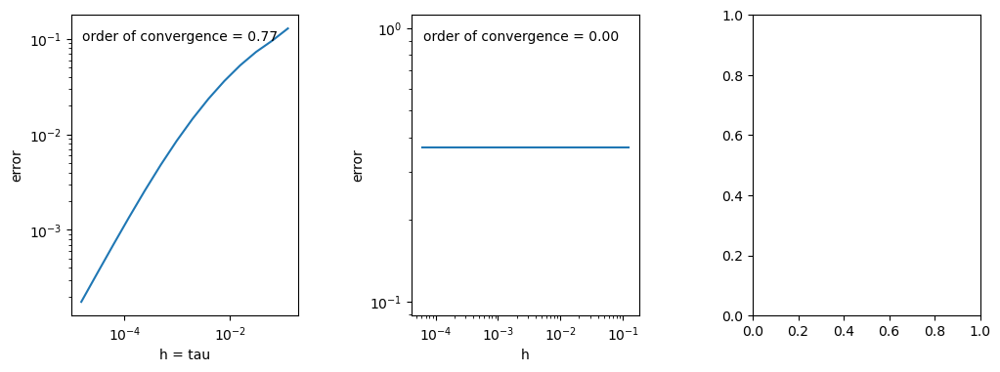

In [3]:
plot_errors("implicit_angle", False)

## Четырехточеяная неявная схема

Схема разваливается

## Схема Лакса

In [ ]:
plot_animation("lax", "rectangle")

In [8]:
plot_animation("lax", "hat")

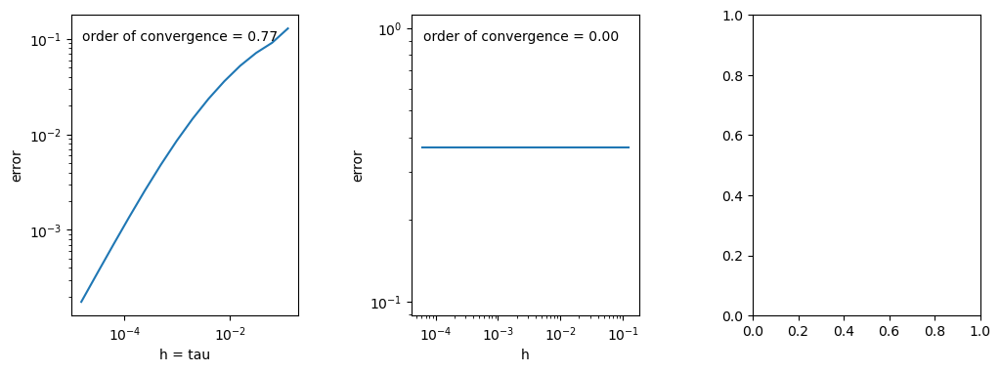

In [4]:
plot_errors("lax", False)

## Схема Лакса-Вендроффа

In [ ]:
plot_animation("lax_wendroff", "rectangle")

In [ ]:
plot_animation("lax_wendroff", "hat")

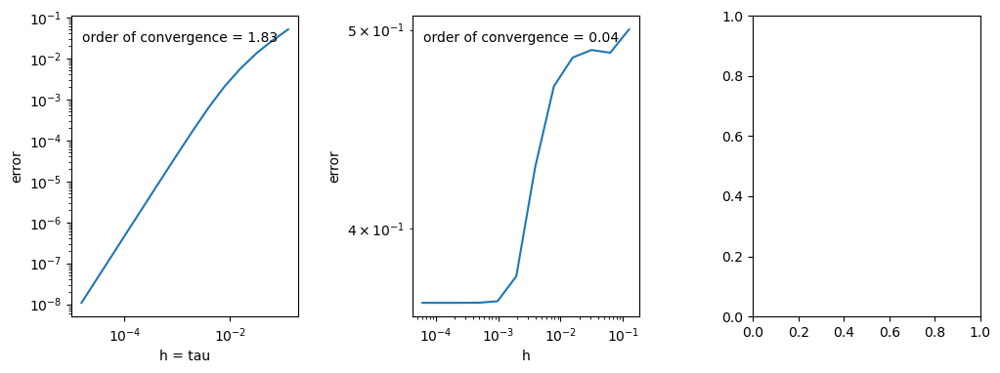

In [5]:
plot_errors("lax_wendroff", False)

## Схема крест

In [ ]:
plot_animation("cross", "rectangle")

In [ ]:
plot_animation("cross", "hat")

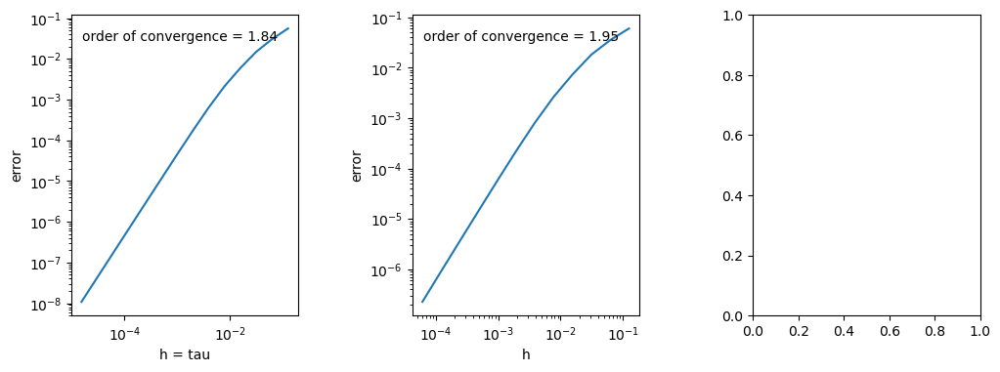

In [7]:
plot_errors("cross", False)